## Advanced Lane Finding Project

The steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')  

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(5)

cv2.destroyAllWindows()
# Camera calibration and undistort

def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    #undist = np.copy(img)  # Delete this line
    gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    #ret, corners = cv2.findChessboardCorners(gray, (8,6), None)
    #img = cv2.drawChessboardCorners(img, (8,6), corners, ret)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)

    return undist

### Load a original calibration image and undistorted the image

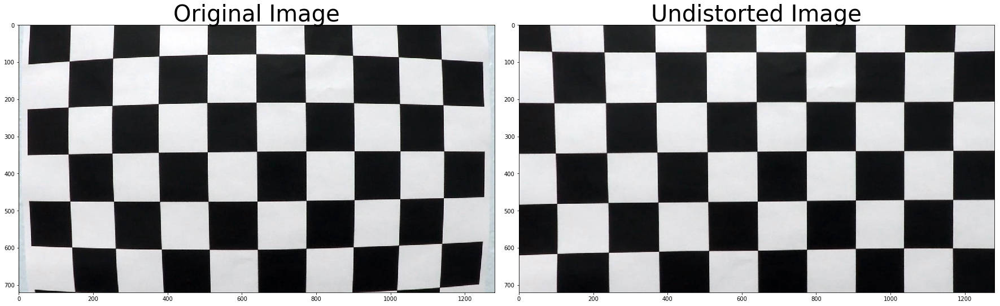

In [2]:
img=cv2.imread(images[0])
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)
undistorted=cal_undistort(img, objpoints, imgpoints)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Load test images and display the undistorted images

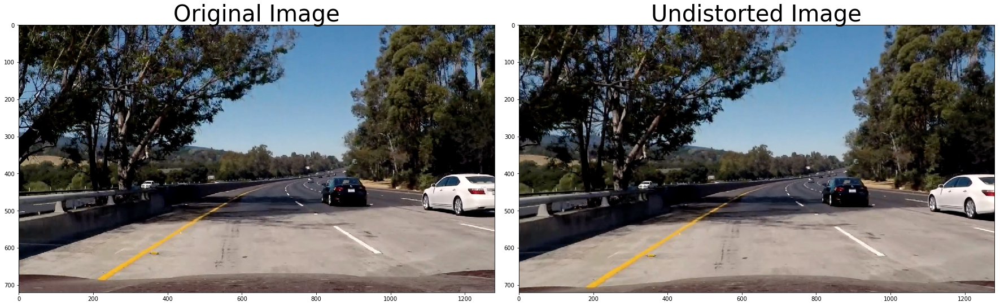

In [48]:
test_images = glob.glob('../test_images/*.jpg')  
test_img=mpimg.imread(test_images[6])
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=40)
undistorted=cal_undistort(test_img, objpoints, imgpoints)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Perspective transform 

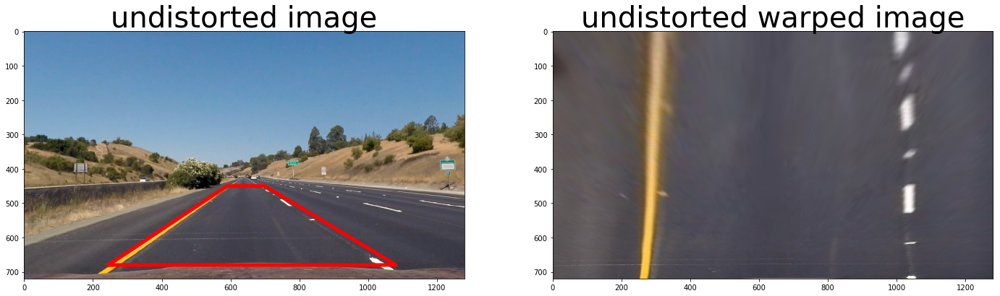

In [49]:
# define a function to unwrap the image
def warp (img):
    h,w=img.shape[:2]
    img_size=(w,h)
    #define 4 source points
    src=np.float32([[245,680],[1080,680],[700,450],[590,450]])
    dst=np.float32([[245,h],[1080,h],[1140,0],[260,0]])
    x = [src[0][0],src[1][0],src[2][0],src[3][0],src[0][0]]
    y = [src[0][1],src[1][1],src[2][1],src[3][1],src[0][1]]
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv
#load the straight line image
straight_img=mpimg.imread(test_images[0])
straight_img=cal_undistort(straight_img, objpoints, imgpoints)
warped,M, Minv=warp(straight_img)
h,w=straight_img.shape[:2]
src=np.float32([[245,680],[1080,680],[700,450],[590,450]])
dst=np.float32([[245,h],[1080,h],[1140,0],[260,0]])
x = [src[0][0],src[1][0],src[2][0],src[3][0],src[0][0]]
y = [src[0][1],src[1][1],src[2][1],src[3][1],src[0][1]]
f, (ax1,ax2) = plt.subplots(1,2,figsize=(24, 9))
ax1.plot(x, y,color='red', linewidth=5, solid_capstyle='round', zorder=2)
ax1.imshow(straight_img)
ax1.set_title('undistorted image', fontsize=40)
ax2.imshow(warped)
ax2.set_title('undistorted warped image', fontsize=40)

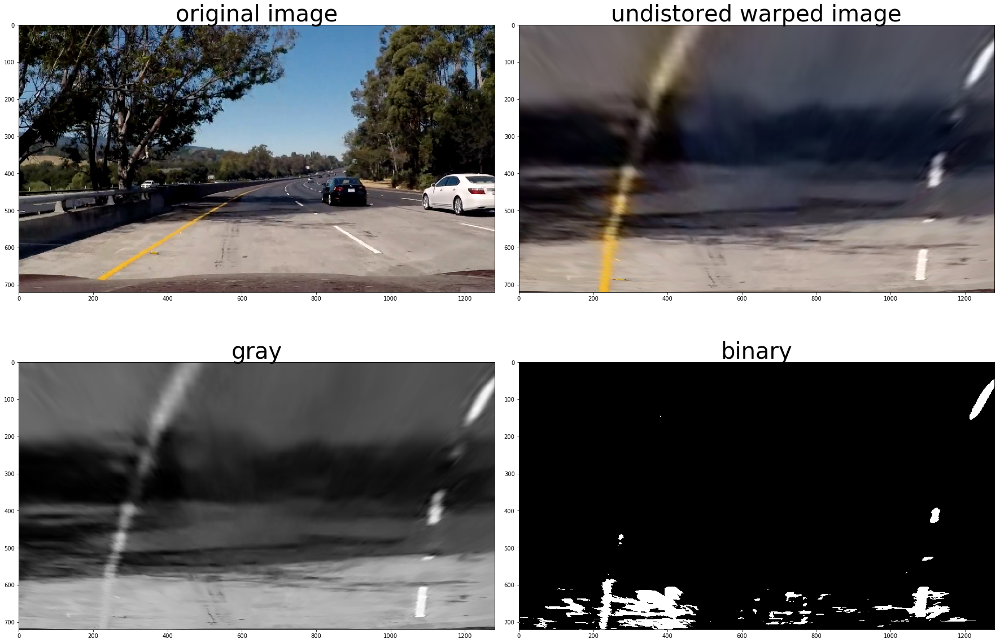

In [50]:
binary_thresh = (180, 255)
warped,M, Minv=warp(test_img)
gray = cv2.cvtColor(warped, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > binary_thresh[0]) & (gray <= binary_thresh[1])] = 1
R_channel = warped[:,:,0]
zeros=np.zeros(R_channel.shape)
f, ax = plt.subplots(2, 2, figsize=(24, 18))
f.tight_layout()
ax[0,0].imshow(test_img)
ax[0,0].set_title('original image', fontsize=40)
ax[0,1].imshow(warped,cmap='gray')
ax[0,1].set_title('undistored warped image', fontsize=40)
ax[1,0].imshow(gray,cmap='gray')
ax[1,0].set_title('gray', fontsize=40)
ax[1,1].imshow(binary,cmap='gray')
ax[1,1].set_title('binary', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

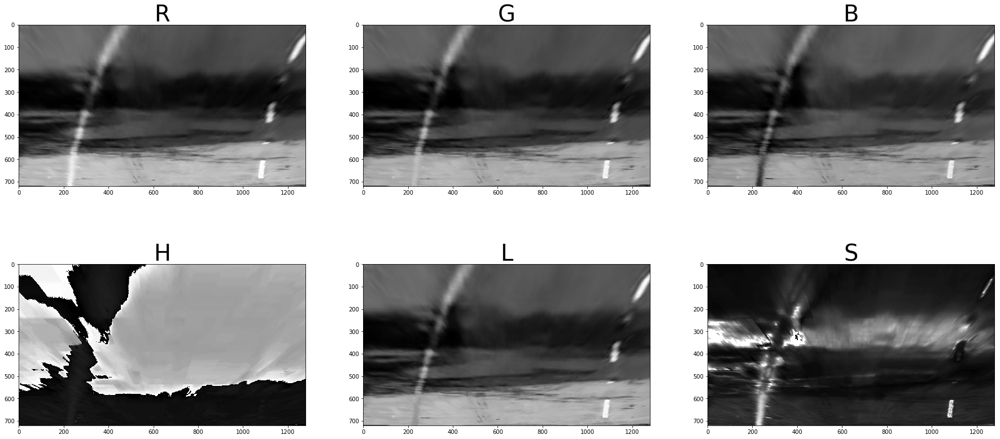

In [51]:
R=warped[:,:,0]
G = warped[:,:,1]
B = warped[:,:,2]

hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]
f, ax = plt.subplots(2, 3, figsize=(24, 12))
ax[0,0].imshow(R,cmap='gray')
ax[0,0].set_title('R', fontsize=40)
ax[0,1].imshow(G,cmap='gray')
ax[0,1].set_title('G', fontsize=40)
ax[0,2].imshow(B,cmap='gray')
ax[0,2].set_title('B', fontsize=40)
ax[1,0].imshow(H,cmap='gray')
ax[1,0].set_title('H', fontsize=40)
ax[1,1].imshow(L,cmap='gray')
ax[1,1].set_title('L', fontsize=40)
ax[1,2].imshow(S,cmap='gray')
ax[1,2].set_title('S', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [52]:
def abs_sobel_thresh(img, orient='x', sobel_thresh=(0,255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient=='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    elif orient=='y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= sobel_thresh[0]) & (scaled_sobel <= sobel_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    sobel_binary = sbinary # Remove this line
    return sobel_binary

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    # Apply threshold
    # 1) Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1,ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    abs_sobelxy = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    # 5) Create a binary mask where mag thresholds are met
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    mag_binary = sbinary # Remove this line
   
    return mag_binary

def hls_select(img, hls_thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    # 2) Apply a threshold to the S channel
    binary = np.zeros_like(S)
    binary[(S > hls_thresh[0]) & (S <= hls_thresh[1])] = 1
    # 3) Return a binary image of threshold result
    S_binary= binary # placeholder line
    return S_binary




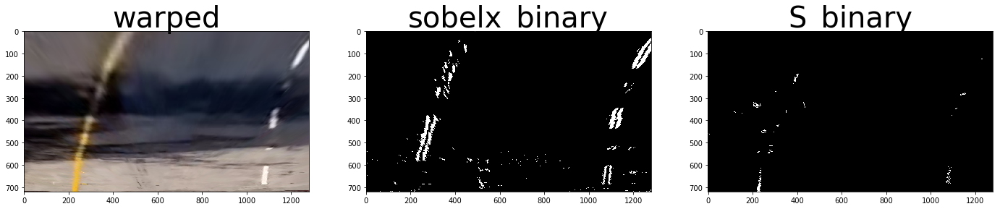

In [63]:
sobelx_binary=abs_sobel_thresh(warped, orient='x', sobel_thresh=(28,255))
S_binary=hls_select(warped, hls_thresh=(205, 250))
f, ax = plt.subplots(1, 3, figsize=(24, 12))
ax[0].imshow(warped,cmap='gray')
ax[0].set_title('warped', fontsize=40)
ax[1].imshow(sobelx_binary,cmap='gray')
ax[1].set_title('sobelx_binary', fontsize=40)
ax[2].imshow(S_binary,cmap='gray')
ax[2].set_title('S_binary', fontsize=40)



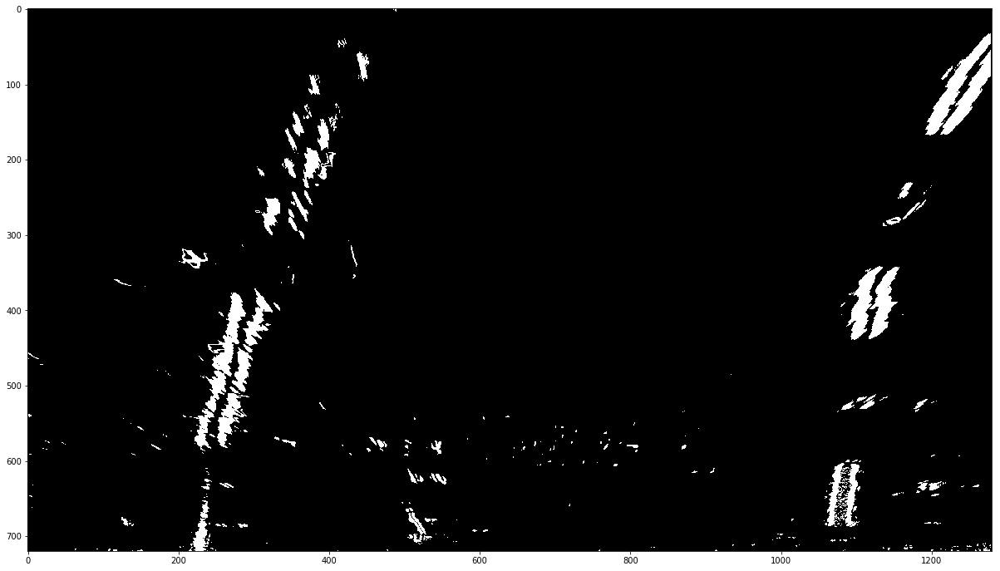

In [54]:
#define a function to create a thresholded binary image
def bi_image(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx_binary=abs_sobel_thresh(img, orient='x', sobel_thresh=(28,255))
    S_binary=hls_select(warped, hls_thresh=(205, 250))
    combined_binary = np.zeros_like(gray)
    combined_binary[(S_binary == 1) | (sobelx_binary == 1)] = 1
    return combined_binary
#combined_binary = np.zeros_like(gray)
#combined_binary[(S_binary == 1) | (sobelx_binary == 1)] = 1
combined_binary=bi_image(warped)
f, ax = plt.subplots(1, figsize=(24, 12))
ax.imshow(combined_binary,cmap='gray')

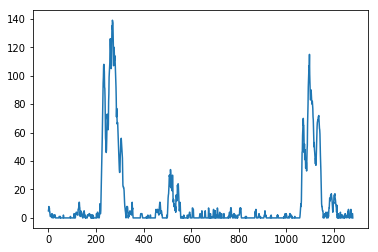

In [55]:
histogram = np.sum(combined_binary[int(combined_binary.shape[0]//2):,:], axis=0)

plt.plot(histogram)


In [56]:
# Define a function to find lane points and fit the points with polynomial function
def find_lane (combined_binary):
    histogram = np.sum(combined_binary[int(combined_binary.shape[0]//2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((combined_binary, combined_binary, combined_binary))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(combined_binary.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = combined_binary.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = combined_binary.shape[0] - (window+1)*window_height
        win_y_high = combined_binary.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Fit a second order polynomial to each lane line
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit, out_img,left_lane_inds, right_lane_inds


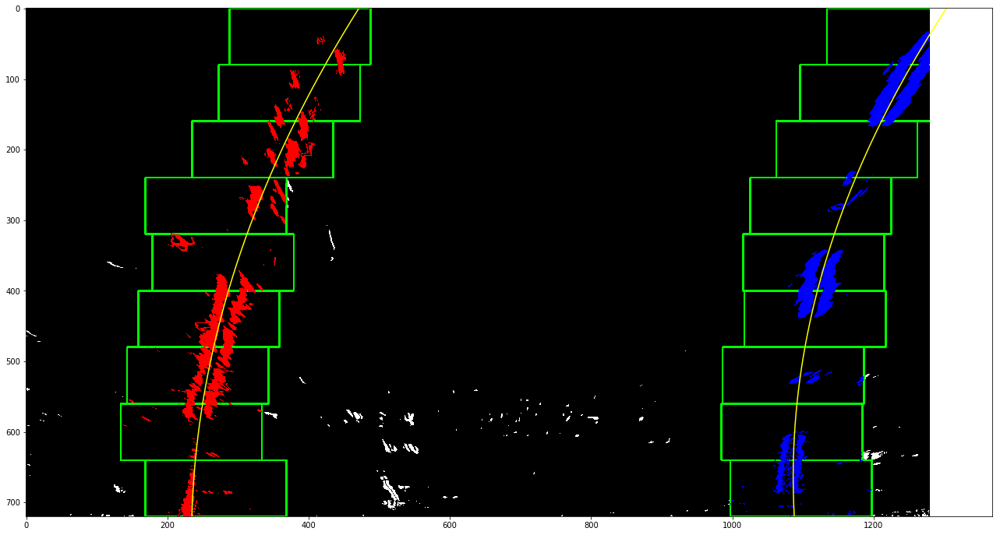

In [57]:
left_fit, right_fit, out_img, left_lane_inds, right_lane_inds= find_lane(combined_binary)
ploty = np.linspace(0, combined_binary.shape[0]-1, combined_binary.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
f, ax = plt.subplots(1, figsize=(24, 12))
ax.imshow(out_img,cmap='gray')
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')

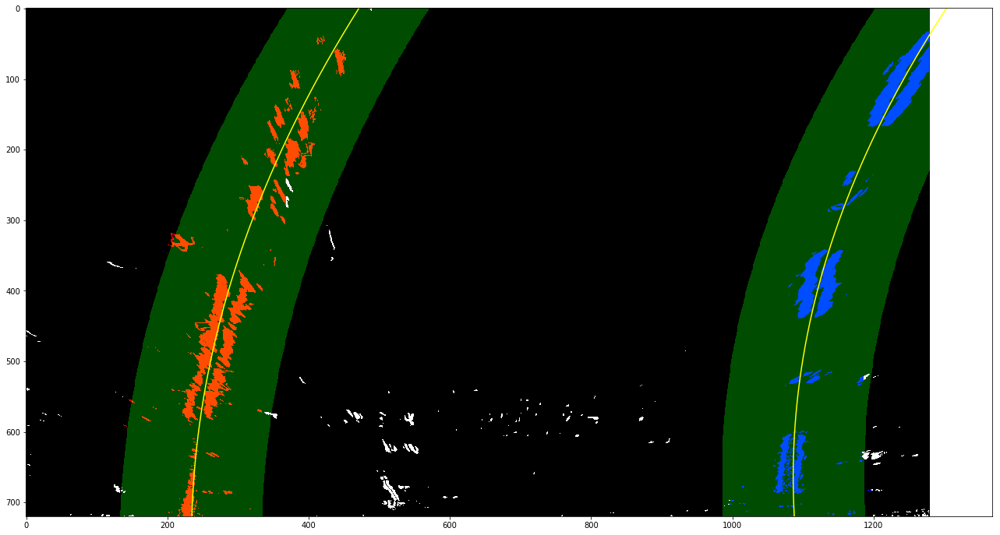

In [58]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((combined_binary, combined_binary, combined_binary))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
nonzero = combined_binary.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
# Set the width of the windows +/- margin
margin = 100

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))

right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
f, ax = plt.subplots(1,figsize=(24, 12))
ax.imshow(result,cmap='gray')
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')



### Calculate the curvature

In [59]:
# Define a function to get curvature radius and location of vehicle
def get_cur_loc (left_fit, right_fit, combined_binary):
    ploty = np.linspace(0, combined_binary.shape[0]-1, combined_binary.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    # Define conversions in x and y from pixels space to meter
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/850 # meters per pixel in x dimension
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now the radius of curvature is the average of the left and right lane radius of curvature, in meters
    cur_rad=(left_curverad+right_curverad)/2
    vehicle_location=(w/2-(left_fitx[-1]+right_fitx[-1])/2)*xm_per_pix 
    if vehicle_location > 0:
        direction = 'left'
    elif vehicle_location < 0:
        direction = 'right'
    return cur_rad, vehicle_location, direction



### Warp the detected lane boundaries back onto the original image

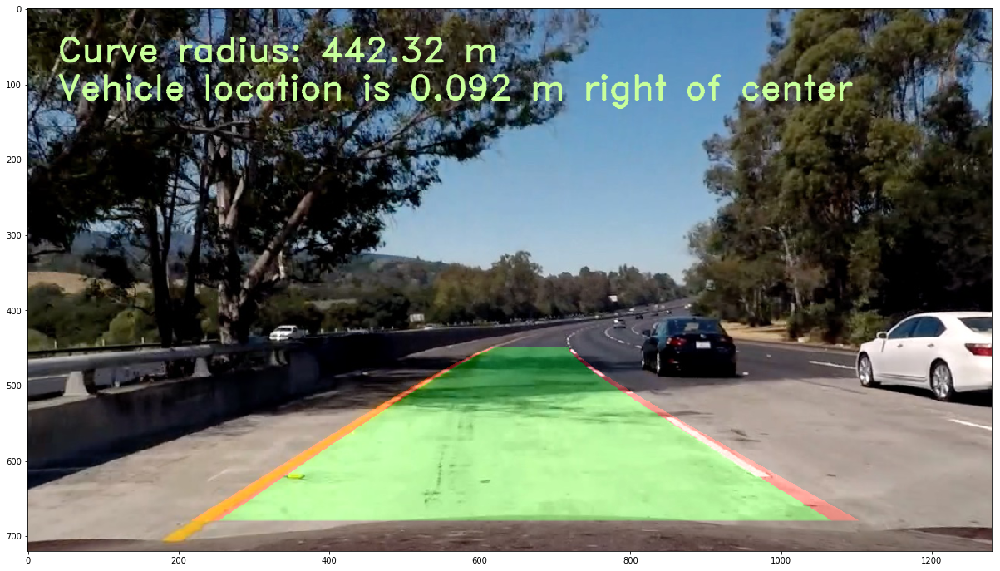

In [60]:
# Define a function to warp the detected lane boundaries back onto the original image
def warp_back(combined_binary,Minv,w,h, direction, undistorted, left_fit, right_fit):
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    ploty = np.linspace(0, combined_binary.shape[0]-1, combined_binary.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,0), thickness=35)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(255,0,0), thickness=35)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    warp_to_original = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    return warp_to_original  
# Define a function to add text on a image
def add_text(warp_to_original, cur_rad,vehicle_location, direction):
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(cur_rad) + ' m'
    cv2.putText(warp_to_original, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    text = 'Vehicle location is'+' {:04.3f}'.format(abs(vehicle_location)) + ' m ' + direction + ' of center'
    cv2.putText(warp_to_original, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return None
cur_rad, vehicle_location, direction1=get_cur_loc (left_fit, right_fit, combined_binary)
warp_to_original=warp_back(combined_binary,Minv,w,h, direction1, undistorted,left_fit, right_fit)
add_text(warp_to_original, cur_rad,vehicle_location, direction1)
f, ax = plt.subplots(1,figsize=(24, 12))
ax.imshow(warp_to_original ,cmap='gray')


    

## Define a complete pipeline to process image

In [61]:
# The complete pipeline to process image
def process_image(img):
    undistorted=cal_undistort(img, objpoints, imgpoints)
    warped, M, Minv=warp(undistorted)
    combined_binary=bi_image(warped)
    left_fit, right_fit, out_img,left_lane_inds, right_lane_inds=find_lane(combined_binary)
    cur_rad, vehicle_location, dire=get_cur_loc (left_fit, right_fit, combined_binary)
    warp_to_original =warp_back(combined_binary,Minv,w,h, dire, undistorted,left_fit, right_fit)
    add_text(warp_to_original, cur_rad,vehicle_location, dire)
    return warp_to_original
   

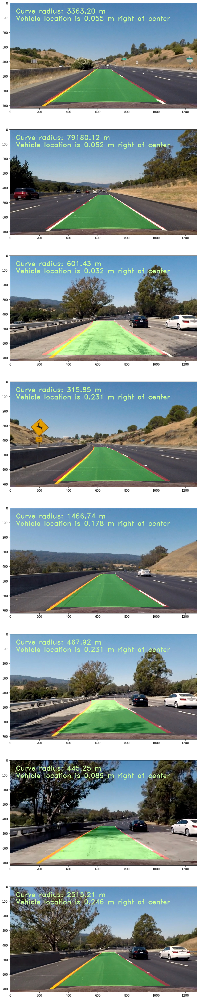

In [62]:
# Process all the test images
f, ax = plt.subplots(8,1,figsize=(72, 60))
i=0
for fname in test_images:
    img = mpimg.imread(fname)
    img=process_image(img)
    ax[i].imshow(img,cmap='gray')
    i+=1


In [37]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('../project_video.mp4')
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [15:05<00:00,  1.40it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 15min 6s
